 2. **Contour Detection [20 pts]**. In this problem we will build a basic contour detector. 

  We have implemented a contour detector that uses the magnitude of the local image gradient as the boundary score as seen below:

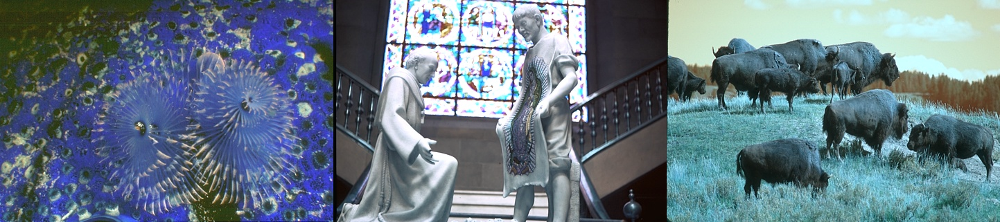

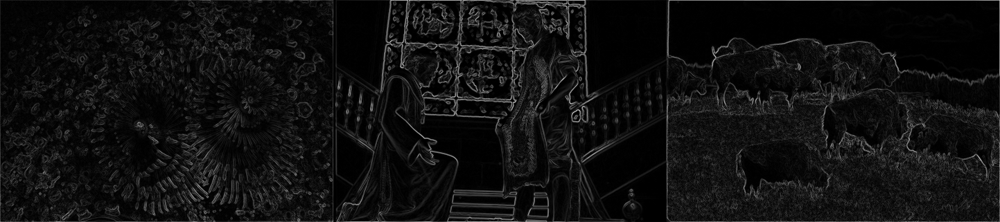

Overall F1 score: 0.4163603293750655


In [1]:
from PIL import Image
import numpy as np
import cv2, os
from scipy.io import loadmat
from scipy import signal
import matplotlib.pyplot as plt
import skimage
import evaluate_boundaries


N_THRESHOLDS = 99

def detect_edges(imlist, fn):
  """
  Detects edges in every image in the image list.
  
  :param imlist: a list of filenames.
  :param fn: an edge detection function.
  
  return: (list of image arrays, list of edge arrays). Edge array is of the same size as the image array.
  """  
  images, edges = [], []
  for imname in imlist:
    I = cv2.imread(os.path.join('data', str(imname)+'.jpg'))
    images.append(I)

    I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)
    I = I.astype(np.float32)/255.
    mag = fn(I)
    edges.append(mag)
  return images, edges

def evaluate(imlist, all_predictions):
  """
  Compares the predicted edges with the ground truth.
  
  :param imlist: a list of images.
  :param all_predictions: predicted edges for imlist.
  
  return: the evaluated F1 score.
  """  
  count_r_overall = np.zeros((N_THRESHOLDS,))
  sum_r_overall = np.zeros((N_THRESHOLDS,))
  count_p_overall = np.zeros((N_THRESHOLDS,))
  sum_p_overall = np.zeros((N_THRESHOLDS,))
  for imname, predictions in zip(imlist, all_predictions):
    gt = loadmat(os.path.join('data', str(imname)+'.mat'))['groundTruth']
    num_gts = gt.shape[1]
    gt = [gt[0,i]['Boundaries'][0,0] for i in range(num_gts)]
    count_r, sum_r, count_p, sum_p, used_thresholds = \
              evaluate_boundaries.evaluate_boundaries_fast(predictions, gt, 
                                                           thresholds=N_THRESHOLDS,
                                                           apply_thinning=True)
    count_r_overall += count_r
    sum_r_overall += sum_r
    count_p_overall += count_p
    sum_p_overall += sum_p

  rec_overall, prec_overall, f1_overall = evaluate_boundaries.compute_rec_prec_f1(
        count_r_overall, sum_r_overall, count_p_overall, sum_p_overall)
  
  return max(f1_overall)

def compute_edges_dxdy(I):
  """
  Returns the norm of dx and dy as the edge response function.
  
  :param I: image array
  
  return: edge array
  """
  
  dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same')
  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag

def normalize(mag):
  """
  Normalizes the edge array to [0,255] for display.
  
  :param mag: unnormalized edge array.
  
  return: normalized edge array
  """  
  mag = mag / 1.5
  mag = mag * 255.
  mag = np.clip(mag, 0, 255)
  mag = mag.astype(np.uint8)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

  **a) Warm-up [5 pts] .** As you visualize the produced edges, you will notice artifacts at image boundaries. Modify how the convolution is being done to minimize these artifacts.

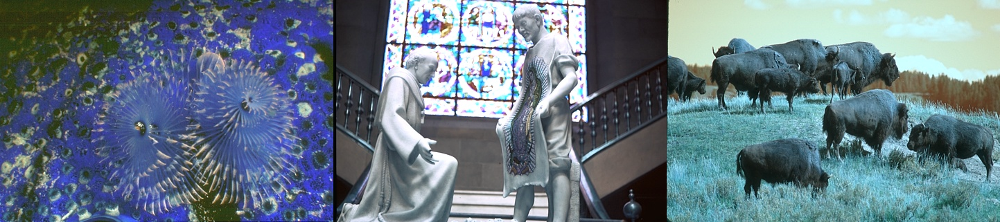

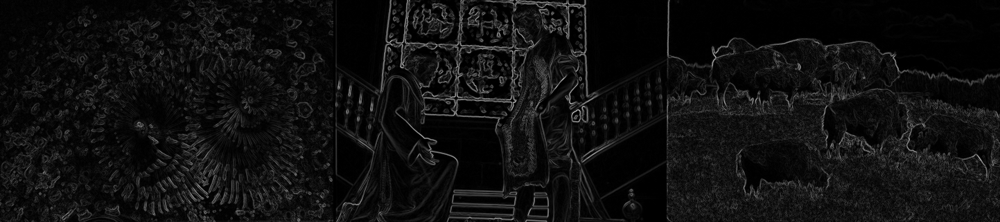

Overall F1 score: 0.4175307435125027


In [2]:
def compute_edges_dxdy_warmup(I):
    """
      Returns the norm of dx and dy as the edge response function.
  
      :param I: image array
  
      return: edge array, which is a HxW numpy array
    """

    """Hint: Look at arguments for scipy.signal.convolve2d"""
  # ADD YOUR CODE HERE
    dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same',boundary='symm')#Symmertrical boundary conditions are added
    dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same',boundary='symm')
    mag = np.sqrt(dx**2 + dy**2)
    mag = normalize(mag)
    return mag
    

imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_warmup
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

 **b) Smoothing [5 pts] .** Next, notice that we are using [−1, 0, 1] filters for computing the gradients, and they are susceptible to noise. Use derivative of Gaussian filters to obtain more robust estimates of the gradient. Experiment with different sigma for this Gaussian filtering and pick the one that works the best.

**c) Non-maximum Suppression [10 pts] .** The current code does not produce thin edges. Implement non-maximum suppression, where we look at the gradient magnitude at the two neighbours in the direction perpendicular to the edge. We suppress the output at the current pixel if the output at the current pixel is not more than at the neighbors. You will have to compute the orientation of the contour (using the X and Y gradients), and then lookup values at the neighbouring pixels.

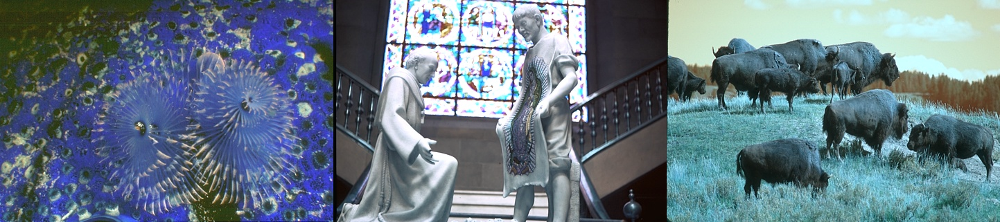

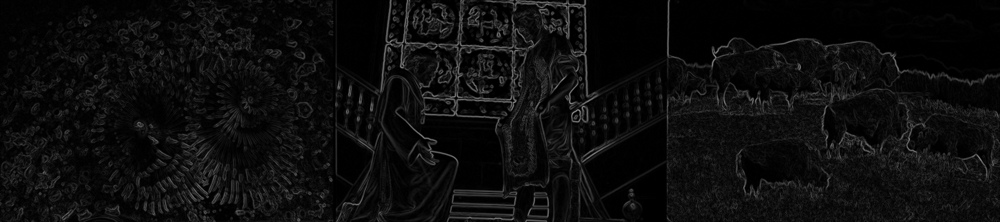

Overall F1 score: 0.41960372210480334


In [27]:
def compute_edges_dxdy_smoothing(I):
    """
    Returns the norm of dx and dy as the edge response function.
  
    :param I: image array
  
    return: edge array, which is a HxW numpy array
    """

    """ Copy over your response from part a and alter it to include this answer. See cv2.GaussianBlur"""
    # ADD YOUR CODE HERE
    
    sigma=0.5
    
    smoothed = cv2.GaussianBlur(I, (0, 0), sigmaX=sigma, sigmaY=sigma)#The kernel size is calculated from the sigma value.

    dx = signal.convolve2d(smoothed, np.array([[-1, 0, 1]]), mode='same',boundary='symm')#Symmertrical boundary conditions are added
    dy = signal.convolve2d(smoothed, np.array([[-1, 0, 1]]).T, mode='same',boundary='symm')
    
    mag = np.sqrt(dx**2 + dy**2)
    mag = normalize(mag)
    return mag
    

imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_smoothing
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

##### Algorithm:
The image is smoothed with cv2.GaussianBlur. The kernel size is made (0,0) so that it is calculated from sigma value. 

Experimentation with Sigma:
1. Sigma=0.2 F1=0.4175
2. Sigma=0.5 F1=0.4196
3. Sigma=1.0 F1=0.4065

Hence the best F1 score is given by Sigma=0.5.

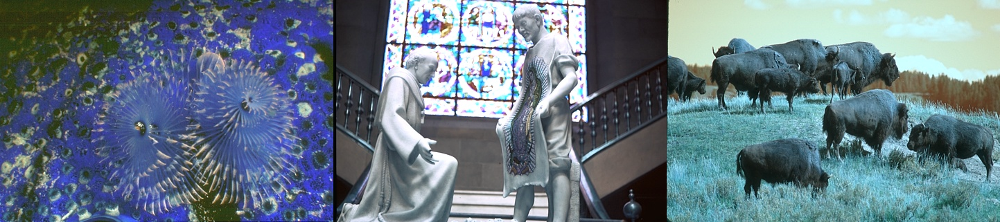

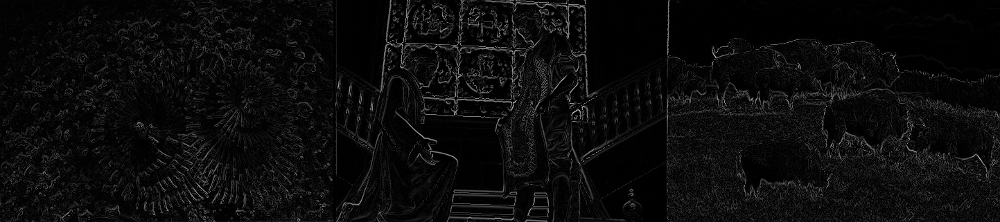

Overall F1 score: 0.4458781167689965


In [24]:
from scipy import ndimage
def compute_edges_dxdy_nonmax(I):
    """
  Returns the norm of dx and dy as the edge response function after non-maximum suppression.
  
  :param I: image array
  
  return: edge array, which is a HxW numpy array
  """

    """ Copy over your response from part b and alter it to include this response"""
  # ADD YOUR CODE in part b
 
    sigma=0.5
    smoothed = cv2.GaussianBlur(I, (0, 0), sigmaX=sigma, sigmaY=sigma)#The kernel size is calculated from the sigma value.

    dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same',boundary='symm')#Symmertrical boundary conditions are added
    dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same',boundary='symm')

    mag = np.sqrt(dx**2 + dy**2)
    mag = normalize(mag)
    theta = np.arctan2(dy, dx)#Orientation of contour
    
    non_max_mag=mag
    
    for i in range(1, mag.shape[0]-1):
        for j in range(1, mag.shape[1]-1):
            pix1 = 0
            pix2 = 0 
            if (0 <= theta[i,j] < np.pi/8) or (7*np.pi/8 <= theta[i,j] <= np.pi):#Horizontal neighbours
                pix1 = mag[i, j+1]
                pix2 = mag[i, j-1]
            elif (np.pi/8 <= theta[i,j] < 3*np.pi/8):#Positive diagonal neighbours
                pix1 = mag[i+1, j-1]
                pix2 = mag[i-1, j+1]
            elif (3*np.pi/8 <= theta[i,j] < 5*np.pi/8):#Negative diagonal neighbours
                pix1 = mag[i+1, j]
                pix2 = mag[i-1, j]
            elif (5*np.pi/8 <= theta[i,j] < 7*np.pi/8):#Vertical Neighbours
                pix1 = mag[i-1, j-1]
                pix2 = mag[i+1, j+1]

            if (mag[i,j] >= pix1) and (mag[i,j] >= pix2):# If current pixel is more than neighbours
                non_max_mag[i,j] = mag[i,j]
            else:
                non_max_mag[i,j] = 0


  # ADD YOUR CODE HERE

    return non_max_mag

imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_nonmax
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

##### Algorithm:
1. The image is smoothed with cv2.GaussianBlur. The kernel size is made (0,0) so that it is calculated from sigma value 0.5.
2. The angle value between the x and y gradients are computed. Conditions are applied on the gradients and accordingly the neighbouring pixels are stored in pix1 and pix2.
3. If the magnitude of the pixel would be greater than neighbouring pixels, the same pixel value is kept otherwise the pixel is suppressed and made 0.


 3. **Stitching pairs of images [30 pts]**. In this problem we will estimate homography transforms to register and stitch image pairs. We are providing a image pairs that you should stitch together. We have also provided sample output, though, keep in mind that your output may look different from the reference output depending on implementation details.
 
   **Getting Started** We have implemented some helper functions to detect feature points in both images and extract descriptor of every keypoint in both images. We used SIFT descriptors from OpenCV library. You can refer to this [tutorial](https://docs.opencv.org/4.5.1/da/df5/tutorial_py_sift_intro.html) for more details about using SIFT in OpenCV. Please use opencv version 4.5 or later.

In [2]:
# some helper functions

def imread(fname):
    """
    Read image into np array from file.
    
    :param fname: filename.
    
    return: image array.
    """
    return cv2.imread(fname)

def imread_bw(fname):
    """
    Read image as gray scale format.
    
    :param fname: filename.
    
    return: image array.
    """
    return cv2.cvtColor(imread(fname), cv2.COLOR_BGR2GRAY)

def imshow(img):
    """
    Show image.
    
    :param img: image array.
    """
    skimage.io.imshow(img)
    
def get_sift_data(img):
    """
    Detect the keypoints and compute their SIFT descriptors with opencv library
    
    :param img: image array.
    
    return: (keypoints array, descriptors). keypoints array (Nx2) contains the coordinate (x,y) of each keypoint. 
    Descriptors have size Nx128.
    """
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img, None)
    kp = np.array([k.pt for k in kp])
    return kp, des

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the match between two image according to the matched keypoints
    
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :param inliers: x,y in the second image and x,y in the first image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,2], inliers[:,3], '+r')
    ax.plot(inliers[:,0] + img1.shape[1], inliers[:,1], '+r')
    ax.plot([inliers[:,2], inliers[:,0] + img1.shape[1]],
            [inliers[:,3], inliers[:,1]], 'r', linewidth=0.4)
    ax.axis('off')

**a) Putative Matches [5 pts].** Select putative matches based on the matrix of pairwise descriptor distances.  First, Compute distances between every descriptor in one image and every descriptor in the other image. We will use `scipy.spatial.distance.cdist(X, Y, 'sqeuclidean')`. Then, you can select all pairs  whose descriptor distances are below a specified threshold, or select the top few hundred descriptor pairs with the smallest pairwise distances. In your report, display the putative matches overlaid on the image pairs.

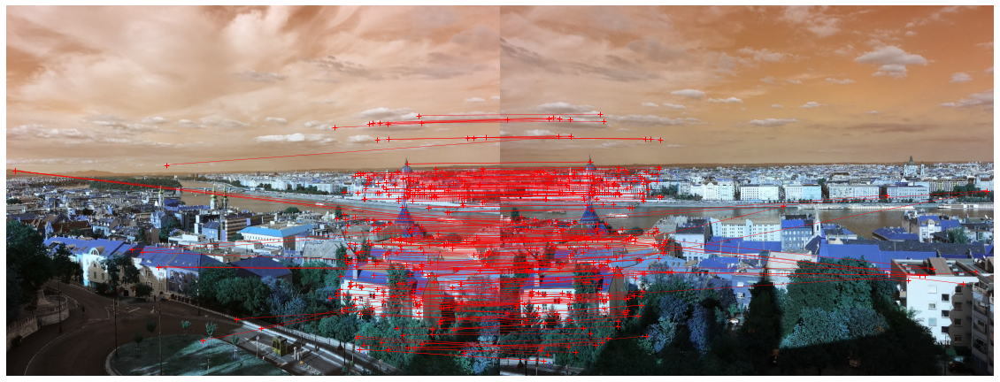

In [3]:
import scipy

def get_best_matches(img1, img2, num_matches):
    """
    Returns the matched keypoints between img1 and img2.
    :param img1: left image.
    :param img2: right image.
    :param num_matches: the number of matches that we want.
    
    return: pixel coordinates of the matched keypoints (x,y in the second image and x,y in the first image), which is a Nx4 numpy array. 
    """
    kp1, des1 = get_sift_data(img1)
    kp2, des2 = get_sift_data(img2)

    # Find distance between descriptors in images
    dist = scipy.spatial.distance.cdist(des1, des2, 'sqeuclidean')
    
    # Write your code to get the matches according to dist
    # ADD YOUR CODE HERE
    idx = np.argsort(dist, axis=None)[:num_matches]# First num_matches descriptors with smallest distance between them are chosen
    idx1 = idx // dist.shape[1]#First image index
    idx2 = idx % dist.shape[1]#Second image index
    out_kp = np.zeros((num_matches, 4))
    out_kp[:, 2] = kp1[idx1, 0]#First image point
    out_kp[:, 3] = kp1[idx1, 1]
    out_kp[:, 0] = kp2[idx2, 0]#Second image point
    out_kp[:, 1] = kp2[idx2, 1]

    return out_kp


img1 = imread('./data/left.jpg')
img2 = imread('./data/right.jpg')

data = get_best_matches(img1, img2, 300)
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img1, img2, data)
#fig.savefig('sift_match.pdf', bbox_inches='tight')

**b) Homography Estimation and RANSAC [20 pts].** Implement RANSAC to estimate a homography mapping one image onto the other. Describe the various implementation details, and report all the hyperparameters, the number of inliers, and the average residual for the inliers (mean squared distance between the point coordinates in one image and the transformed coordinates of the matching point in the other image). Also, display the locations of inlier matches in both images.
        
  **Hints:** For RANSAC, a very simple implementation is sufficient. Use four matches to initialize the homography in each iteration. You should output a single transformation that gets the most inliers in the course of all the iterations. For the various RANSAC parameters (number of iterations, inlier threshold), play around with a few reasonable values and pick the ones that work best. Homography fitting calls for homogeneous least squares. The solution to the homogeneous least squares system $AX = 0$ is obtained from the SVD of $A$ by the singular vector corresponding to the smallest singular value. In Python, `U, S, V = numpy.linalg.svd(A)` performs the singular value decomposition (SVD). This function decomposes A into $U, S, V$ such that $A = USV$ (and not $USV^T$) and `V[−1,:]` gives the right singular vector corresponding to the smallest singular value. *Your implementation should not use any opencv functions.*

Inliers: 282
Average Residual: 0.921874364368584


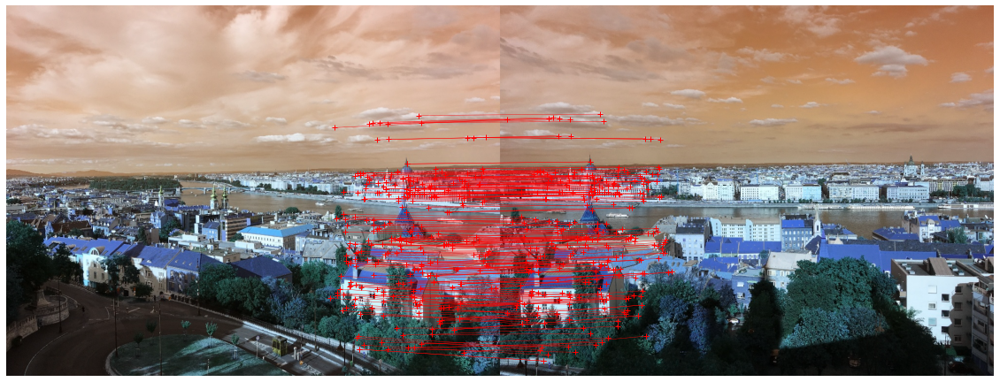

In [4]:

def ransac(data, max_iters=10000, min_inliers=10):
    """
    Write your ransac code to find the best model, inliers, and residuals
    
    :param data: pixel coordinates of matched keypoints.
    :param max_iters: number of maximum iterations
    :param min_inliers: number of minimum inliers in RANSAC
    
    return: (homography matrix, number of inliers) -> (3x3 numpy array, int)
    """
    
    # ADD YOUR CODE HERE

    best_perf = []
    H_out = None
    for i in range(max_iters):
        # randomly choose 4 points from the matrix to compute the homography
        pairs = [data[i] for i in np.random.choice(len(data), 4)]# Four points chosen in random

        H = compute_homography(pairs)# Homography matrix computed
        inliers=[]
        dist=0
        for pair in data:
            p1 = np.array([pair[0], pair[1], 1])#Point in image 1
            p2 = np.array([pair[2], pair[3], 1])#Point in image 2

            p2_estimate = np.dot(H, np.transpose(p1))
            p2_estimate = (1 / p2_estimate[2]) * p2_estimate
    

            distance=np.linalg.norm(np.transpose(p2) - p2_estimate)#Distance between points in one image to transformed coordinates in another image
            if distance< 5:
                inliers.append(list(pair))#Inliers are stored
                dist+=distance#Total distance calculated
                
            
        if len(inliers) > len(best_perf) and len(inliers)>min_inliers :#If current inliers are more than best and minimum inliers required
            best_perf = inliers
            dist_out=dist#Total distance
            H_out = H# Best homography matrix
    
    #return , len(best_inliers)
    #H_out,best_perf=

    return H_out, len(best_perf), best_perf, dist_out

def compute_homography(matches):
    """
    Write your code to compute homography according to the matches
    
    :param matches: coordinates of matched  keypoints.
    
    return: homography matrix, which is a 3x3 numpy array
    """
    
    # ADD YOUR CODE HERE
    A = []
    for x1, y1, x2, y2 in matches:#Homography matrix computation
        A.append([x1, y1, 1, 0, 0, 0, -x2 * x1, -x2 * y1, -x2])
        A.append([0, 0, 0, x1, y1, 1, -y2 * x1, -y2 * y1, -y2])
    A = np.array(A)
    #print(A.shape)
    U, S, V = np.linalg.svd(A)#SVD solver
    H = V[-1,:].reshape((3,3))
    #H = (1 / H.item(8)) * H
    return H

np.random.seed(1237)
# Report the number of inliers in your matching
H, max_inliers, inliers, residual = ransac(data)
inliers=np.array(inliers)
print("Inliers:", max_inliers)
print("Average Residual:", residual/max_inliers)
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img1, img2, inliers.reshape(max_inliers,4))

Implementation details:
1. Computing Homography: 

a. From the 4 points passed as matches, the first two are point coordinates of first image and the second two are point coordinates of second image.

b. The homography matrix array in formed by appending the coordinates.

c. SVD is applied on the homography matrix.

d. The singular vector corresponding to the smallest singular value is returned.

2. RANSAC:

a. Four points are taken at random and stored in pairs.

b. Homography matrix is computed for them.

c. The distance between all the points in the two images are computed after homography transformation of second image.

d. If the distance is less than 5( distance threshold) the points are stored in inliers and their mean squared-error distance value is added to calculate residual for the inliers.

e. Every time if inliers count is better than the previous best then its stored as best and the corresponding residual distance is stored.

Hyperparameters:
1. min_inliers: Minimum number of inliers for ransac(default: 10)
2. Distance threshold: Twice the distance the points can lie to be considered as inlier on each side of the line.
3. max_iters: Maximum number of times the ransac algorithm is executed.

Results: 
1. The number of inliers is 282.
2. The average residual for the inliers is 0.92
3. The locations of inlier matches in both the images are shown above.


**c) Image Warping [5 pts].** Warp one image onto the other using the estimated transformation. You can use opencv functions for this purpose.

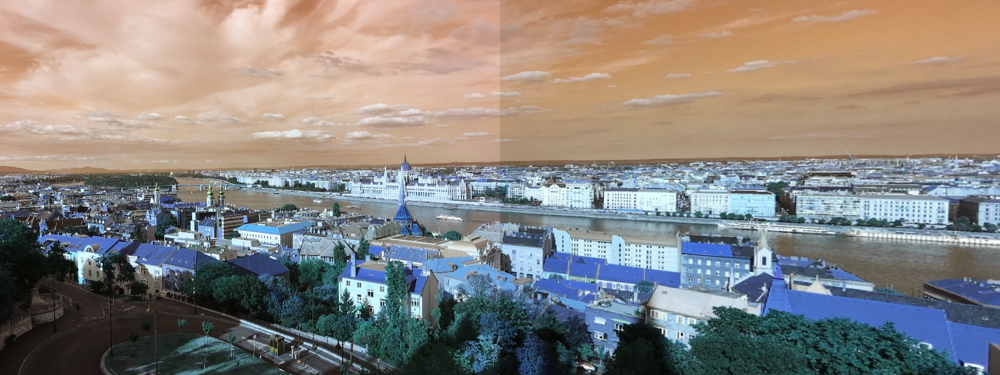

In [5]:
def warp_images(img1, img2, H):
    """
    Write your code to stitch images together according to the homography
    
    :param img1: left image
    :param img2: right image
    :param H: homography matrix
    
    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE
    
    h1, w1 = img1.shape[:2]#Size of image 1
    h2, w2 = img2.shape[:2]#Size of image 2
    
    # Warp img2 onto img1 using the homography matrix
    img_warped = cv2.warpPerspective(img2, H, (w1+w2, h1))#Warped image
    
    #Image 1 is copied on img_warped
    img_warped[:h1, :w1, :] = img1
    
    return img_warped
    


# display the stitching results
img_warped = warp_images(img1, img2, H)
display(Image.fromarray(img_warped))

**d) Image Warping Bonus [5 bonus pts].** Warp one image onto the other using the estimated transformation *without opencv functions*. Create a new image big enough to hold the panorama and composite the two images into it. You can composite by averaging the pixel values where the two images overlap, or by using the pixel values from one of the images. Your result should look similar to the sample output. You should create **color panoramas** by applying  the same compositing step to each of the color channels separately (for estimating the transformation, it is sufficient to use grayscale images). You may find `ProjectiveTransform` and warp functions in `skimage.transform` useful.

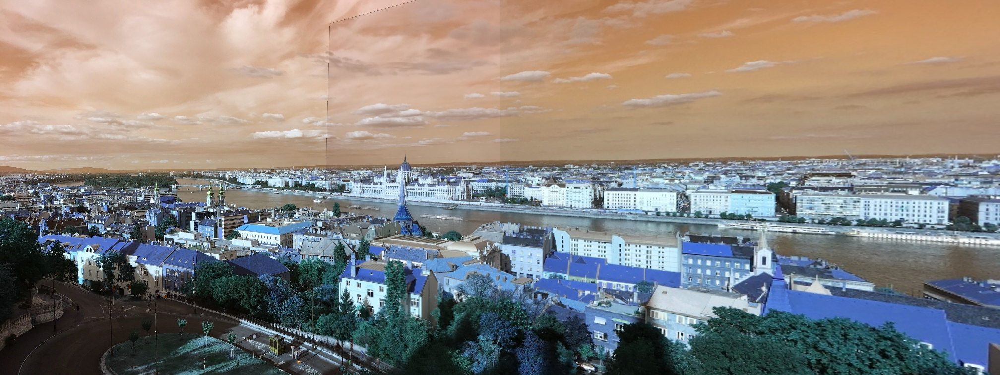

In [14]:
import skimage.transform
import skimage.color


def warp_images_noopencv(img1, img2, H):
    """
    Write your code to stitch images together according to the homography
    
    :param img1: left image
    :param img2: right image
    :param H: homography matrix
    
    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE
    
    tform = skimage.transform.ProjectiveTransform()# Projective Transform is initialized 
    tform.params = H# Homography matrix parameters are passed to projective transform
    img_warped = skimage.transform.warp(img2, tform.inverse, output_shape=(img2.shape[0],img2.shape[1]+img1.shape[1]))#Image 2 is warped using skimage.transform.warp
    
    img_warped_gray = skimage.color.rgb2gray((img_warped*255))#Image warped is changed to grayscale

    panorama_height = img_warped.shape[0]#panorama height 
    panorama_width = img_warped.shape[1]#panorama width
    panorama = np.zeros((panorama_height, panorama_width, 3), dtype=np.float32)#panorama is initialized with zeros

    # Composite the two images into the panorama image
    panorama[:img1.shape[0], :img1.shape[1], :] = img1#The leftmost side is image 1
    panorama[:,img1.shape[1]:,:]=(img_warped*255)[:,img1.shape[1]:,:]#Right side is image 2
    overlap_mask = (skimage.color.rgb2gray(panorama) != 0) & (img_warped_gray != 0)# Binary mask with overlapping pixel values as True
    panorama[overlap_mask] = (panorama[overlap_mask] + (img_warped*255)[overlap_mask])/2#Averaging of pixels
    img_warped= panorama.astype(np.uint8)
    return img_warped
    
    
    #return img_warped

# display and report the stitching results
img_warped_nocv = warp_images_noopencv(img1, img2, H)
display(Image.fromarray(img_warped_nocv))